# Sankey Budget Diagrams (Clean)
**Notebook 2b of 2** — requires `.nc` files produced by `model_load.ipynb`.

Clean variant of `sankey_figures.ipynb`: multi-model mean (MME) sankeys default to
no flow labels, no residual node, and simplified reservoir/group node names.
See the **Config** cell below to toggle these options.

Ice and snow mass budget Sankey diagrams for the Southern and Northern Hemispheres.
Set `melt_path` below to match `save_path` in `model_load.ipynb`.

In [1]:
# Install these packages once per session on the cryohub.
# Skip if these packages are already installed in your environment
%pip install -q kaleido==0.2.1
%pip install -q regionmask       # regional masking for geospatial data

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import xarray as xr
from functools import reduce
from dask.diagnostics import ProgressBar
import glob
import os
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from functions import (
    sel_model, drop_sel,
    preprocess_snap_to_month_start,
    make_ice_sankey_plotly, make_snow_sankey_plotly,
    make_ice_sankey_uncertainty_plotly, make_snow_sankey_uncertainty_plotly,
    _ice_reservoir_total, _snow_reservoir_total,
)

In [3]:
add_CESM2_LE=True

In [4]:
if add_CESM2_LE==True:  
    SANKEY_MODELS = ["ACCESS-CM2", "HadGEM3-GC31-LL", "UKESM1-0-LL","MRI-ESM2-0",
                 "CESM2-WACCM","CESM2-LE", "NorESM2-LM","CNRM-CM6-1","CNRM-ESM2-1","IPSL-CM6A-LR","EC-Earth3"]
else:
    SANKEY_MODELS = ["ACCESS-CM2", "HadGEM3-GC31-LL", "UKESM1-0-LL","MRI-ESM2-0",
                 "CESM2-WACCM", "NorESM2-LM","CNRM-CM6-1","CNRM-ESM2-1","IPSL-CM6A-LR","EC-Earth3"]

In [5]:
# ── Display options ───────────────────────────────────────────────────────────
# Add Gt yr⁻¹ labels to each flow (MME sankey / individual model sankeys).
SHOW_VALUES_MME     = False
SHOW_VALUES_MODELS  = False

# Add each flow's % of total sources/sinks (MME sankey / individual model sankeys).
SHOW_PERCENT_MME    = True
SHOW_PERCENT_MODELS = True

# Set SHOW_RESIDUAL = False  to hide the grey Residual balancing node in all sankeys.
SHOW_RESIDUAL       = True

# Set True (default) to render every ice and snow Sankey (all models + MME, all
# regions) with inter-ensemble-member uncertainty shading (faded ribbons + ±1 SD
# range in each node label) via make_ice_sankey_uncertainty_plotly /
# make_snow_sankey_uncertainty_plotly, instead of the plain make_ice_sankey_plotly /
# make_snow_sankey_plotly rendering. Set False to go back to the plain (unshaded)
# sankeys everywhere.
SHOW_UNCERTAINTY    = True

# Reference-flux "ruler" bar drawn in the left margin at the same px-per-Gt scale
# as the ribbons, so absolute magnitudes can be read off any figure. Set
# SHOW_SCALE_BAR = False to drop it everywhere. SCALE_BAR_SKIP lists
# (region, model) pairs to omit it from — the SO MME is the busiest figure, where
# the bar has the least room and the least to add.
SHOW_SCALE_BAR      = True
SCALE_BAR_SKIP      = set()   # e.g. {('SO', None)} to drop it from the SO MME

# Set True to further restrict each budget's members to those with data for every
# variable in that budget (snow_models / ice_models below), instead of each flux
# being filtered independently. See the "member availability" cell below.
use_members_with_all_variables = False
# ── Display options ───────────────────────────────────────────────────────────
# Add Gt yr⁻¹ labels to each flow (MME sankey / individual model sankeys).
SHOW_VALUES_MME     = False
SHOW_VALUES_MODELS  = False

# Add each flow's % of total sources/sinks (MME sankey / individual model sankeys).
SHOW_PERCENT_MME    = True
SHOW_PERCENT_MODELS = True

# Set SHOW_RESIDUAL = False  to hide the grey Residual balancing node in all sankeys.
SHOW_RESIDUAL       = True

# Set True (default) to render every ice and snow Sankey (all models + MME, all
# regions) with inter-ensemble-member uncertainty shading (faded ribbons + ±1 SD
# range in each node label) via make_ice_sankey_uncertainty_plotly /
# make_snow_sankey_uncertainty_plotly, instead of the plain make_ice_sankey_plotly /
# make_snow_sankey_plotly rendering. Set False to go back to the plain (unshaded)
# sankeys everywhere.
SHOW_UNCERTAINTY    = True

# Reference-flux "ruler" bar drawn in the left margin at the same px-per-Gt scale
# as the ribbons, so absolute magnitudes can be read off any figure. Set
# SHOW_SCALE_BAR = False to drop it everywhere. SCALE_BAR_SKIP lists
# (region, model) pairs to omit it from — the SO MME is the busiest figure, where
# the bar has the least room and the least to add.
SHOW_SCALE_BAR      = True
SCALE_BAR_SKIP      = set()   # e.g. {('SO', None)} to drop it from the SO MME

# Set True to further restrict each budget's members to those with data for every
# variable in that budget (snow_models / ice_models below), instead of each flux
# being filtered independently. See the "member availability" cell below.
use_members_with_all_variables = False


In [6]:
melt_path = '/home/jovyan/shared-public/ICESat-2-sea-ice/better_output/melt/'

xr_dict = {'coords': 'minimal', 'data_vars': 'minimal', 'compat': 'override', 'combine_attrs': 'override'}

## Load Data

Each variable is loaded across all CMIP6 models using `open_mfdataset` with `concat_dim='member_id'`. `preprocess_snap_to_month_start` aligns time coordinates to the first of each month before concatenation, since different models use different within-month timestamps. CESM2-LE files are loaded separately and merged in below.

In [7]:
# get all matching files
all_dynamics_files = sorted(glob.glob(melt_path + '*_dynamics_2015_2100.nc'))
dynamics_files = [f for f in all_dynamics_files if 'snow_dynamics' not in f]

In [8]:
CMIP6_snowfall = xr.open_mfdataset(melt_path+'*_snowfall_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start).mean('experiment_id')
CMIP6_snowmelt = xr.open_mfdataset(melt_path+'*_snowmelt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_snow_ice_snow = xr.open_mfdataset(melt_path+'*_snow_ice_snow_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                       preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_snow_dynamics = xr.open_mfdataset(melt_path+'*_snow_dynamics_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                       preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_wind_drift = xr.open_mfdataset(melt_path+'*_wind_drift_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                       preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_evap_subl_snow = xr.open_mfdataset(melt_path+'*_evap_subl_snow_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                       preprocess=preprocess_snap_to_month_start,).mean('experiment_id')


CMIP6_basal_growth = xr.open_mfdataset(melt_path+'*_basal_growth_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                      preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_frazil = xr.open_mfdataset(melt_path+'*_frazil_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_snow_ice = xr.open_mfdataset(melt_path+'*_snow_ice_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_top_melt = xr.open_mfdataset(melt_path+'*_top_melt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_basal_melt = xr.open_mfdataset(melt_path+'*_basal_melt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                    preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_lateral_melt = xr.open_mfdataset(melt_path+'*_lateral_melt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                      preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_evap_subl = xr.open_mfdataset(melt_path+'*_evap_subl_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                    preprocess=preprocess_snap_to_month_start).mean('experiment_id')
CMIP6_dynamics = xr.open_mfdataset(dynamics_files,combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start,).mean('experiment_id')
CMIP6_thermo = xr.open_mfdataset(melt_path+'*_thermo_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,
                                  preprocess=preprocess_snap_to_month_start,).mean('experiment_id')

/tmp/ipykernel_3157/3768580411.py:3: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_snowmelt = xr.open_mfdataset(melt_path+'*_snowmelt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:15: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_basal_growth = xr.open_mfdataset(melt_path+'*_basal_growth_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:17: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_frazil = xr.open_mfdataset(melt_path+'*_frazil_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:19: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_snow_ice = xr.open_mfdataset(melt_path+'*_snow_ice_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:21: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_top_melt = xr.open_mfdataset(melt_path+'*_top_melt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:23: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_basal_melt = xr.open_mfdataset(melt_path+'*_basal_melt_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


/tmp/ipykernel_3157/3768580411.py:27: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  CMIP6_evap_subl = xr.open_mfdataset(melt_path+'*_evap_subl_2015_2100.nc',combine='nested',parallel=True, chunks={'time': -1, 'member_id': 1},concat_dim='member_id',**xr_dict,


In [9]:
LE2_snowfall = xr.open_mfdataset(melt_path+'LE2_snowfall_2015_2034.nc').mean('experiment_id')
LE2_snowmelt = xr.open_mfdataset(melt_path+'LE2_snowmelt_2015_2034.nc').mean('experiment_id')
LE2_snow_ice_snow = xr.open_mfdataset(melt_path+'LE2_snow_ice_snow_2015_2034.nc').mean('experiment_id')
LE2_evap_subl_snow = xr.open_mfdataset(melt_path+'LE2_evap_subl_snow_2015_2034.nc').mean('experiment_id')

LE2_basal_growth = xr.open_mfdataset(melt_path+'LE2_basal_growth_2015_2034.nc').mean('experiment_id')
LE2_frazil = xr.open_mfdataset(melt_path+'LE2_frazil_2015_2034.nc').mean('experiment_id')
LE2_snow_ice = xr.open_mfdataset(melt_path+'LE2_snow_ice_2015_2034.nc').mean('experiment_id')
LE2_top_melt = xr.open_mfdataset(melt_path+'LE2_top_melt_2015_2034.nc').mean('experiment_id')
LE2_basal_melt = xr.open_mfdataset(melt_path+'LE2_basal_melt_2015_2034.nc').mean('experiment_id')
LE2_lateral_melt = xr.open_mfdataset(melt_path+'LE2_lateral_melt_2015_2034.nc').mean('experiment_id')
LE2_evap_subl = xr.open_mfdataset(melt_path+'LE2_evap_subl_2015_2034.nc').mean('experiment_id')
LE2_dynamics = xr.open_mfdataset(melt_path+'LE2_dynamics_2015_2034.nc').mean('experiment_id')
LE2_thermo = xr.open_mfdataset(melt_path+'LE2_thermo_2015_2034.nc').mean('experiment_id')

In [10]:
# Ice: member_ids present across all required ice-budget variables (every model
# reports all seven, so this is a plain all-variables intersection).
ice_models = reduce(np.intersect1d, [
    CMIP6_basal_growth.member_id, CMIP6_frazil.member_id, CMIP6_snow_ice.member_id, CMIP6_top_melt.member_id,
    CMIP6_basal_melt.member_id, CMIP6_lateral_melt.member_id, CMIP6_evap_subl.member_id,
])

# Snow: no model reports all six snow variables (snow_dynamics/wind_drift/evap_subl_snow
# are each only archived for a subset of models), and coverage varies by model — e.g. one
# model may only report snowmelt+snowfall. So the max is taken per model (the member_id
# prefix before the first "_"), not globally: each model keeps its own best-covered members.
_snow_vars = [CMIP6_snowfall.member_id, CMIP6_snowmelt.member_id, CMIP6_snow_ice_snow.member_id,
              CMIP6_snow_dynamics.member_id, CMIP6_wind_drift.member_id, CMIP6_evap_subl_snow.member_id]
_all_snow_members = reduce(np.union1d, _snow_vars)
_snow_var_counts = np.array([sum(m in v.values for v in _snow_vars) for m in _all_snow_members])
_snow_model_prefix = np.array([m.split('_')[0] for m in _all_snow_members])

snow_models = np.concatenate([
    _all_snow_members[_snow_model_prefix == _prefix][
        _snow_var_counts[_snow_model_prefix == _prefix] == _snow_var_counts[_snow_model_prefix == _prefix].max()
    ]
    for _prefix in np.unique(_snow_model_prefix)
])

In [11]:
CMIP6_snowfall_available = CMIP6_snowfall.sel(time=slice('2015','2034')).snowfall_SH.where(lambda x:x.time.dt.month==6,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_snowmelt_available = CMIP6_snowmelt.sel(time=slice('2015','2034')).snowmelt_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_snow_ice_snow_available = CMIP6_snow_ice_snow.sel(time=slice('2015','2034')).snow_ice_snow_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_snow_dynamics_available = CMIP6_snow_dynamics.sel(time=slice('2015','2034')).snow_dynamics_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_wind_drift_available = CMIP6_wind_drift.sel(time=slice('2015','2034')).wind_drift_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_evap_subl_snow_available = CMIP6_evap_subl_snow.sel(time=slice('2015','2034')).evap_subl_snow_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id

CMIP6_basal_growth_available = CMIP6_basal_growth.sel(time=slice('2015','2034')).basal_growth_SH.where(lambda x:x.time.dt.month==6,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_frazil_available = CMIP6_frazil.sel(time=slice('2015','2034')).frazil_SH.where(lambda x:x.time.dt.month==6,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_snow_ice_available = CMIP6_snow_ice.sel(time=slice('2015','2034')).snow_ice_SH.where(lambda x:x.time.dt.month==6,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_top_melt_available = CMIP6_top_melt.sel(time=slice('2015','2034')).top_melt_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_basal_melt_available = CMIP6_basal_melt.sel(time=slice('2015','2034')).basal_melt_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_lateral_melt_available = CMIP6_lateral_melt.sel(time=slice('2015','2034')).lateral_melt_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_evap_subl_available = CMIP6_evap_subl.sel(time=slice('2015','2034')).evap_subl_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_dynamics_available = CMIP6_dynamics.sel(time=slice('2015','2034')).dynamics_IA.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id
CMIP6_thermo_available = CMIP6_thermo.sel(time=slice('2015','2034')).thermo_SH.where(lambda x:x.time.dt.month==1,drop=True
                                                                                               ).where(lambda x:x!=0).mean('time',skipna=False).dropna('member_id').member_id

if use_members_with_all_variables:
    CMIP6_snowfall_available       = np.intersect1d(CMIP6_snowfall_available, snow_models)
    CMIP6_snowmelt_available       = np.intersect1d(CMIP6_snowmelt_available, snow_models)
    CMIP6_snow_ice_snow_available  = np.intersect1d(CMIP6_snow_ice_snow_available, snow_models)
    CMIP6_snow_dynamics_available  = np.intersect1d(CMIP6_snow_dynamics_available, snow_models)
    CMIP6_wind_drift_available     = np.intersect1d(CMIP6_wind_drift_available, snow_models)
    CMIP6_evap_subl_snow_available = np.intersect1d(CMIP6_evap_subl_snow_available, snow_models)

    CMIP6_basal_growth_available  = np.intersect1d(CMIP6_basal_growth_available, ice_models)
    CMIP6_frazil_available        = np.intersect1d(CMIP6_frazil_available, ice_models)
    CMIP6_snow_ice_available      = np.intersect1d(CMIP6_snow_ice_available, ice_models)
    CMIP6_top_melt_available      = np.intersect1d(CMIP6_top_melt_available, ice_models)
    CMIP6_basal_melt_available    = np.intersect1d(CMIP6_basal_melt_available, ice_models)
    CMIP6_lateral_melt_available  = np.intersect1d(CMIP6_lateral_melt_available, ice_models)
    CMIP6_evap_subl_available     = np.intersect1d(CMIP6_evap_subl_available, ice_models)

For each variable, identify which CMIP6 `member_id`s have non-zero data in the 2015–2034 window. Models that do not report a given flux (e.g. NorESM2 does not output `sndmassdyn`) will have returned `None` from `load_data()` and produce an empty `member_id` dimension here, so they are automatically excluded from the corresponding budget.

In [12]:
if add_CESM2_LE==True:
    CMIP6_snowfall = xr.concat([CMIP6_snowfall.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snowfall_available)
                               ,LE2_snowfall.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_snowmelt = xr.concat([CMIP6_snowmelt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snowmelt_available)
                               ,LE2_snowmelt.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_snow_ice_snow = xr.concat([CMIP6_snow_ice_snow.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_ice_snow_available)
                               ,LE2_snow_ice_snow.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_snow_dynamics = CMIP6_snow_dynamics.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_dynamics_available)
    CMIP6_wind_drift = CMIP6_wind_drift.sel(time=slice('2015','2034')).sel(member_id=CMIP6_wind_drift_available)
    CMIP6_evap_subl_snow = xr.concat([CMIP6_evap_subl_snow.sel(time=slice('2015','2034')).sel(member_id=CMIP6_evap_subl_snow_available)
                               ,LE2_evap_subl_snow.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    
    CMIP6_basal_growth = xr.concat([CMIP6_basal_growth.sel(time=slice('2015','2034')).sel(member_id=CMIP6_basal_growth_available)
                               ,LE2_basal_growth.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_frazil = xr.concat([CMIP6_frazil.sel(time=slice('2015','2034')).sel(member_id=CMIP6_frazil_available)
                               ,LE2_frazil.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_snow_ice = xr.concat([CMIP6_snow_ice.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_ice_available)
                               ,LE2_snow_ice.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_top_melt = xr.concat([CMIP6_top_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_top_melt_available)
                               ,LE2_top_melt.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_basal_melt = xr.concat([CMIP6_basal_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_basal_melt_available)
                               ,LE2_basal_melt.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_lateral_melt = xr.concat([CMIP6_lateral_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_lateral_melt_available)
                               ,LE2_lateral_melt.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_evap_subl = xr.concat([CMIP6_evap_subl.sel(time=slice('2015','2034')).sel(member_id=CMIP6_evap_subl_available)
                               ,LE2_evap_subl.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_dynamics = xr.concat([CMIP6_dynamics.sel(time=slice('2015','2034')).sel(member_id=CMIP6_dynamics_available)
                               ,LE2_dynamics.sel(time=slice('2015','2034'))],'member_id',**xr_dict)
    CMIP6_thermo = xr.concat([CMIP6_thermo.sel(time=slice('2015','2034')).sel(member_id=CMIP6_thermo_available)
                               ,LE2_thermo.sel(time=slice('2015','2034'))],'member_id',**xr_dict)

else:
    
    CMIP6_snowfall = CMIP6_snowfall.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snowfall_available)
    CMIP6_snowmelt = CMIP6_snowmelt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snowmelt_available)
    CMIP6_snow_ice_snow = CMIP6_snow_ice_snow.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_ice_snow_available)
    CMIP6_snow_dynamics = CMIP6_snow_dynamics.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_dynamics_available)
    CMIP6_wind_drift = CMIP6_wind_drift.sel(time=slice('2015','2034')).sel(member_id=CMIP6_wind_drift_available)
    CMIP6_evap_subl_snow = CMIP6_evap_subl_snow.sel(time=slice('2015','2034')).sel(member_id=CMIP6_evap_subl_snow_available)
    
    CMIP6_basal_growth = CMIP6_basal_growth.sel(time=slice('2015','2034')).sel(member_id=CMIP6_basal_growth_available)
    CMIP6_frazil = CMIP6_frazil.sel(time=slice('2015','2034')).sel(member_id=CMIP6_frazil_available)
    CMIP6_snow_ice = CMIP6_snow_ice.sel(time=slice('2015','2034')).sel(member_id=CMIP6_snow_ice_available)
    CMIP6_top_melt = CMIP6_top_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_top_melt_available)
    CMIP6_basal_melt = CMIP6_basal_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_basal_melt_available)
    CMIP6_lateral_melt = CMIP6_lateral_melt.sel(time=slice('2015','2034')).sel(member_id=CMIP6_lateral_melt_available)
    CMIP6_evap_subl = CMIP6_evap_subl.sel(time=slice('2015','2034')).sel(member_id=CMIP6_evap_subl_available)
    CMIP6_dynamics = CMIP6_dynamics.sel(time=slice('2015','2034')).sel(member_id=CMIP6_dynamics_available)
    CMIP6_thermo = CMIP6_thermo.sel(time=slice('2015','2034')).sel(member_id=CMIP6_thermo_available)

In [13]:
def ensemble_mean(ds, thresh=1):
    """Compute per-model ensemble mean, requiring at least thresh members."""
    members_count = ds.member_id.groupby(ds.member_id.str.split('split','_').sel(split=0)).count()
    models = members_count.where(members_count >= thresh).dropna('member_id').member_id
    ens_mean = ds.groupby(ds.member_id.str.split('split','_').sel(split=0)).mean()
    ens_mean = ens_mean.sel(member_id=models)
    ens_mean['member_id'] = ens_mean.member_id.astype(dtype='<U25')
    return ens_mean

Concatenate each filtered CMIP6 variable with its CESM2-LE counterpart along `member_id`, giving a single array spanning all models and ensemble members for 2015–2034.

## Budget Dictionaries

Each dict maps flux name → DataArray over `(member_id, time)`. Sign convention: positive = mass gain, negative = mass loss. `dynamics` can be either sign (import or export) and is split into inflow/outflow at plot time. Separate dicts are defined for the Southern Hemisphere (`_SH`), Weddell Sea (`_Weddell`), and Northern Hemisphere (`_NH`). Curently, Weddell Sea budgets are not plotted.

In [14]:
ice_budget_Weddell = {
    'basal growth': CMIP6_basal_growth['basal_growth_Weddell'],
    'frazil': CMIP6_frazil['frazil_Weddell'],
    'snowice': CMIP6_snow_ice['snow_ice_Weddell'],
    'top melt': CMIP6_top_melt['top_melt_Weddell'],
    'basal melt': CMIP6_basal_melt['basal_melt_Weddell'],
    'lateral melt': CMIP6_lateral_melt['lateral_melt_Weddell'],
    'evapsubl': CMIP6_evap_subl['evap_subl_Weddell'],
    'dynamics': CMIP6_dynamics['dynamics_Weddell'],
}

ice_budget_SH = {
    'basal growth': CMIP6_basal_growth['basal_growth_SH'],
    'frazil': CMIP6_frazil['frazil_SH'],
    'snowice': CMIP6_snow_ice['snow_ice_SH'],
    'top melt': CMIP6_top_melt['top_melt_SH'],
    'basal melt': CMIP6_basal_melt['basal_melt_SH'],
    'lateral melt': CMIP6_lateral_melt['lateral_melt_SH'],
    'evapsubl': CMIP6_evap_subl['evap_subl_SH'],
    'dynamics': CMIP6_dynamics['dynamics_SH'],
}

ice_budget_NH = {
    'basal growth': CMIP6_basal_growth['basal_growth_NH'],
    'frazil': CMIP6_frazil['frazil_NH'],
    'snowice': CMIP6_snow_ice['snow_ice_NH'],
    'top melt': CMIP6_top_melt['top_melt_NH'],
    'basal melt': CMIP6_basal_melt['basal_melt_NH'],
    'lateral melt': CMIP6_lateral_melt['lateral_melt_NH'],
    'evapsubl': CMIP6_evap_subl['evap_subl_NH'],
    'dynamics': CMIP6_dynamics['dynamics_NH'],
}

ice_budget_IA = {
    'basal growth': CMIP6_basal_growth['basal_growth_IA'].dropna('member_id'),
    'frazil': CMIP6_frazil['frazil_IA'].dropna('member_id'),
    'snowice': CMIP6_snow_ice['snow_ice_IA'].dropna('member_id'),
    'top melt': CMIP6_top_melt['top_melt_IA'].dropna('member_id'),
    'basal melt': CMIP6_basal_melt['basal_melt_IA'].dropna('member_id'),
    'lateral melt': CMIP6_lateral_melt['lateral_melt_IA'].dropna('member_id'),
    'evapsubl': CMIP6_evap_subl['evap_subl_IA'].dropna('member_id'),
    'dynamics': CMIP6_dynamics['dynamics_IA'].dropna('member_id'),
}

ice_colors = {
    'basal growth': 'red',
    'frazil': 'purple',
    'snowice': 'orange',
    'top melt': 'blue',
    'basal melt': 'lime',
    'lateral melt': 'cyan',
    'evapsubl': 'magenta',
    'dynamics': 'olive',
}

ice_markers = {
    'basal growth': '^',
    'frazil': '<',
    'snowice': 'D',
    'top melt': 'v',
    'basal melt': 'o',
    'lateral melt': 'o',
    'evapsubl': '>',
    'dynamics': 'o',
}

In [15]:
snow_budget_Weddell = {
    'snowfall': CMIP6_snowfall['snowfall_Weddell'],
    'snowmelt': CMIP6_snowmelt['snowmelt_Weddell'],
    'snow to ice': CMIP6_snow_ice_snow['snow_ice_snow_Weddell'],
    'dynamics': CMIP6_snow_dynamics['snow_dynamics_Weddell'],
    'wind drift': CMIP6_wind_drift['wind_drift_Weddell'],
    'evapsubl': CMIP6_evap_subl_snow['evap_subl_snow_Weddell'],
}
snow_budget_SH = {
    'snowfall': CMIP6_snowfall['snowfall_SH'],
    'snowmelt': CMIP6_snowmelt['snowmelt_SH'],
    'snow to ice': CMIP6_snow_ice_snow['snow_ice_snow_SH'],
    'dynamics': CMIP6_snow_dynamics['snow_dynamics_SH'],
    'wind drift': CMIP6_wind_drift['wind_drift_SH'],
    'evapsubl': CMIP6_evap_subl_snow['evap_subl_snow_SH']
}
snow_budget_NH = {
    'snowfall': CMIP6_snowfall['snowfall_NH'],
    'snowmelt': CMIP6_snowmelt['snowmelt_NH'],
    'snow to ice': CMIP6_snow_ice_snow['snow_ice_snow_NH'],
    'dynamics': CMIP6_snow_dynamics['snow_dynamics_NH'],
    'wind drift': CMIP6_wind_drift['wind_drift_NH'],
    'evapsubl': CMIP6_evap_subl_snow['evap_subl_snow_NH']
}

snow_budget_IA = {
    'snowfall': CMIP6_snowfall['snowfall_IA'].dropna('member_id'),
    'snowmelt': CMIP6_snowmelt['snowmelt_IA'].dropna('member_id'),
    'snow to ice': CMIP6_snow_ice_snow['snow_ice_snow_IA'].dropna('member_id'),
    'dynamics': CMIP6_snow_dynamics['snow_dynamics_IA'].dropna('member_id'),
    'wind drift': CMIP6_wind_drift['wind_drift_IA'],
    'evapsubl': CMIP6_evap_subl_snow['evap_subl_snow_IA'].dropna('member_id')
}

snow_colors = {   
        'snowfall':   'royalblue',
        'snowmelt':   'tomato',
        'snow to ice': 'darkorange',
        'dynamics':   'gray',
        'wind drift': 'slategray',
        'evapsubl':   'mediumpurple',
    }
        
snow_markers = {  
        'snowfall':   'o',
        'snowmelt':   'v',
        'snow to ice': 'D',
        'dynamics':   's',
        'wind drift': '^',
        'evapsubl':   'P',
    }

In [16]:
# ── Automated budget QC ────────────────────────────────────────────────────────
# Triage checks (wrong-sign terms, per-model/per-member magnitude outliers, budget-
# closure residuals, non-zero net dynamics/wind-drift) that previously required
# eyeballing plot_ice_terms_climatology or the raw area-integrated fluxes. These are
# warnings only — nothing here modifies data or blocks the run; review flagged models
# against README "Model-Specific Corrections" before deciding whether a fix is needed.
from functions import run_budget_qc

budget_qc_warnings = []
for _region_label, _ice_b, _snow_b in [
    ("SO", ice_budget_SH, snow_budget_SH),
    ("AO", ice_budget_NH, snow_budget_NH),
    ("IA", ice_budget_IA, snow_budget_IA),
]:
    budget_qc_warnings += run_budget_qc(_ice_b, budget_type="ice", region_label=_region_label)
    budget_qc_warnings += run_budget_qc(_snow_b, budget_type="snow", region_label=_region_label)

if not budget_qc_warnings:
    print("Budget QC: no issues flagged.")

[QC] SO/ice 'NorESM2-LM' 'top melt': magnitude_outlier_model — |119| Gt/yr is 5.8x the cross-model median |696| Gt/yr
[QC] SO/ice 'NorESM2-MM' 'top melt': magnitude_outlier_model — |112| Gt/yr is 6.2x the cross-model median |696| Gt/yr
[QC] SO/ice 'CNRM-CM6-1' 'lateral melt': magnitude_outlier_model — |49| Gt/yr is 10.3x the cross-model median |508| Gt/yr
[QC] SO/ice 'CNRM-CM6-1-HR' 'lateral melt': magnitude_outlier_model — |40| Gt/yr is 12.7x the cross-model median |508| Gt/yr
[QC] SO/ice 'CNRM-ESM2-1' 'lateral melt': magnitude_outlier_model — |34| Gt/yr is 14.8x the cross-model median |508| Gt/yr
[QC] SO/ice 'ACCESS-CM2' 'evapsubl': magnitude_outlier_model — |282| Gt/yr is 12.7x the cross-model median |22| Gt/yr
[QC] SO/ice 'HadGEM3-GC31-LL' 'evapsubl': magnitude_outlier_model — |437| Gt/yr is 19.6x the cross-model median |22| Gt/yr
[QC] SO/ice 'UKESM1-0-LL' 'evapsubl': magnitude_outlier_model — |520| Gt/yr is 23.3x the cross-model median |22| Gt/yr
[QC] SO/ice 'CESM2-WACCM' 'evapsub

[QC] SO/snow 'ACCESS-CM2' 'dynamics': magnitude_outlier_model — |484| Gt/yr is 7.7x the cross-model median |63| Gt/yr
[QC] SO/snow 'CNRM-CM6-1' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 3966.7x the cross-model median |63| Gt/yr
[QC] SO/snow 'CNRM-CM6-1-HR' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 619.0x the cross-model median |63| Gt/yr
[QC] SO/snow 'CNRM-ESM2-1' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 4673.0x the cross-model median |63| Gt/yr
[QC] SO/snow 'MRI-ESM2-0' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 8347711.5x the cross-model median |63| Gt/yr
[QC] SO/snow 'ACCESS-CM2' '(all terms)': closure_residual — gains 4092 vs. losses 1924 Gt/yr (36% of throughput)
[QC] SO/snow 'CESM2' '(all terms)': closure_residual — gains 4783 vs. losses 1576 Gt/yr (50% of throughput)
[QC] SO/snow 'CESM2-WACCM' '(all terms)': closure_residual — gains 4881 vs. losses 2081 Gt/yr (40% of throughput)
[QC] SO/snow 'EC-Earth3' '(all terms)': closure_residual — gains 

[QC] AO/ice 'CNRM-CM6-1' 'lateral melt': magnitude_outlier_model — |147| Gt/yr is 5.5x the cross-model median |806| Gt/yr
[QC] AO/ice 'CNRM-CM6-1-HR' 'lateral melt': magnitude_outlier_model — |109| Gt/yr is 7.4x the cross-model median |806| Gt/yr
[QC] AO/ice 'CNRM-ESM2-1' 'lateral melt': magnitude_outlier_model — |125| Gt/yr is 6.5x the cross-model median |806| Gt/yr
[QC] AO/ice 'ACCESS-CM2' 'evapsubl': magnitude_outlier_model — |340| Gt/yr is 5.9x the cross-model median |57| Gt/yr
[QC] AO/ice 'CNRM-CM6-1' 'evapsubl': magnitude_outlier_model — |5| Gt/yr is 12.2x the cross-model median |57| Gt/yr
[QC] AO/ice 'CNRM-CM6-1-HR' 'evapsubl': magnitude_outlier_model — |10| Gt/yr is 5.7x the cross-model median |57| Gt/yr
[QC] AO/ice 'CNRM-ESM2-1' 'evapsubl': magnitude_outlier_model — |4| Gt/yr is 14.3x the cross-model median |57| Gt/yr
[QC] AO/ice 'HadGEM3-GC31-LL' 'evapsubl': magnitude_outlier_model — |370| Gt/yr is 6.5x the cross-model median |57| Gt/yr
[QC] AO/ice 'UKESM1-0-LL' 'evapsubl': m

[QC] AO/snow 'CNRM-CM6-1' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 6654.3x the cross-model median |73| Gt/yr
[QC] AO/snow 'CNRM-CM6-1-HR' 'dynamics': magnitude_outlier_model — |2| Gt/yr is 33.9x the cross-model median |73| Gt/yr
[QC] AO/snow 'CNRM-ESM2-1' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 13009.3x the cross-model median |73| Gt/yr
[QC] AO/snow 'MRI-ESM2-0' 'dynamics': magnitude_outlier_model — |0| Gt/yr is 113669378.2x the cross-model median |73| Gt/yr
[QC] AO/snow 'ACCESS-CM2' '(all terms)': closure_residual — gains 2417 vs. losses 1464 Gt/yr (25% of throughput)
[QC] AO/snow 'CESM2' '(all terms)': closure_residual — gains 1857 vs. losses 1146 Gt/yr (24% of throughput)
[QC] AO/snow 'EC-Earth3' '(all terms)': closure_residual — gains 1922 vs. losses 1141 Gt/yr (25% of throughput)
[QC] AO/snow 'NorESM2-LM' '(all terms)': closure_residual — gains 2105 vs. losses 1444 Gt/yr (19% of throughput)
[QC] AO/snow 'NorESM2-MM' '(all terms)': closure_residual — gains 2320

[QC] IA/ice 'CNRM-CM6-1' 'snowice': magnitude_outlier_model — |1295| Gt/yr is 7.3x the cross-model median |178| Gt/yr
[QC] IA/ice 'CNRM-CM6-1-HR' 'snowice': magnitude_outlier_model — |1297| Gt/yr is 7.3x the cross-model median |178| Gt/yr
[QC] IA/ice 'CNRM-ESM2-1' 'snowice': magnitude_outlier_model — |1337| Gt/yr is 7.5x the cross-model median |178| Gt/yr
[QC] IA/ice 'CNRM-CM6-1' 'lateral melt': magnitude_outlier_model — |64| Gt/yr is 7.0x the cross-model median |455| Gt/yr
[QC] IA/ice 'CNRM-CM6-1-HR' 'lateral melt': magnitude_outlier_model — |61| Gt/yr is 7.4x the cross-model median |455| Gt/yr
[QC] IA/ice 'CNRM-ESM2-1' 'lateral melt': magnitude_outlier_model — |55| Gt/yr is 8.2x the cross-model median |455| Gt/yr
[QC] IA/ice 'ACCESS-CM2' 'evapsubl': magnitude_outlier_model — |209| Gt/yr is 5.3x the cross-model median |40| Gt/yr
[QC] IA/ice 'CNRM-CM6-1' 'evapsubl': magnitude_outlier_model — |1| Gt/yr is 43.8x the cross-model median |40| Gt/yr
[QC] IA/ice 'CNRM-CM6-1-HR' 'evapsubl': ma

[QC] IA/snow 'ACCESS-CM2' '(all terms)': closure_residual — gains 1335 vs. losses 830 Gt/yr (23% of throughput)
[QC] IA/snow 'ACCESS-CM2' 'dynamics': net_term_nonzero — -223 Gt/yr is 10% of gross throughput (expected ≈0 at full-region scale)
[QC] IA/snow 'CESM2' '(all terms)': closure_residual — gains 1193 vs. losses 772 Gt/yr (21% of throughput)
[QC] IA/snow 'EC-Earth3' '(all terms)': closure_residual — gains 1183 vs. losses 766 Gt/yr (21% of throughput)
[QC] IA/snow 'NorESM2-LM' '(all terms)': closure_residual — gains 1239 vs. losses 725 Gt/yr (26% of throughput)
[QC] IA/snow 'NorESM2-MM' '(all terms)': closure_residual — gains 1344 vs. losses 841 Gt/yr (23% of throughput)


## Figures

In [17]:
os.makedirs("figures", exist_ok=True)

In [18]:
# Compute a shared height scale so every ice Sankey figure is proportionally sized
# relative to the largest throughput across all regions and models.
ICE_SANKEY_SCALE_REF = max(
  (_ice_reservoir_total(_budget, model=_model)
   for _budget in (ice_budget_SH, ice_budget_NH)
   for _model in SANKEY_MODELS + [None]),
  key=lambda t: t[0],
)

In [19]:
# Same shared scale for snow Sankeys. ACCESS-CM2 is excluded from all snow figures
# due to suspect snowmelt values (see model notes in model_load.ipynb).
#_snow_skip = ['ACCESS-CM2']
_snow_skip = []
SNOW_SANKEY_SCALE_REF = max(
  (_snow_reservoir_total({k: drop_sel(da, _snow_skip) for k, da in _budget.items()}, model=_model)
   for _budget in (snow_budget_SH, snow_budget_NH)
   for _model in [m for m in SANKEY_MODELS if m not in _snow_skip] + [None]),
  key=lambda t: t[0],
)

In [20]:
# Scale-bar length, in Gt yr⁻¹: fixed round values, not derived from the data, so
# the ruler means the same thing across reruns and across the ERA5 figures. Shared
# across every figure of that budget type (which already share scale_ref), and a
# sensible fraction of the tallest reservoir (ice scale_ref ~31,000; snow ~6,400).
ICE_SCALE_BAR_GT  = 10_000
SNOW_SCALE_BAR_GT = 2_000
print(f"ice scale bar:  {ICE_SCALE_BAR_GT:,.0f} Gt yr⁻¹  (scale_ref {ICE_SANKEY_SCALE_REF[0]:,.0f})")
print(f"snow scale bar: {SNOW_SCALE_BAR_GT:,.0f} Gt yr⁻¹  (scale_ref {SNOW_SANKEY_SCALE_REF[0]:,.0f})")


ice scale bar:  10,000 Gt yr⁻¹  (scale_ref 31,226)
snow scale bar: 2,000 Gt yr⁻¹  (scale_ref 6,427)


### Ice Mass Budget

In [21]:
# ── Plotly Sankey: ice mass budget ───────────────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = ICE_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('SO', _model) not in SCALE_BAR_SKIP) else None
    if SHOW_UNCERTAINTY:
        fig = make_ice_sankey_uncertainty_plotly(
            ice_budget_SH, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Southern Hemisphere", include_dynamics=False,
        )
    else:
        fig = make_ice_sankey_plotly(
            ice_budget_SH, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Southern Hemisphere",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/ice_sankey_SO_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/ice_sankey_SO_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/ice_sankey_SO_{label}_2015-2034.svg")
    fig.show()

[normalization] Sea Ice Mass (ACCESS-CM2, Southern Hemisphere): reservoir=15,241.3 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.488, plot_area=180px


[normalization] Sea Ice Mass (HadGEM3-GC31-LL, Southern Hemisphere): reservoir=18,037.0 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.578, plot_area=201px


[normalization] Sea Ice Mass (UKESM1-0-LL, Southern Hemisphere): reservoir=19,287.7 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.618, plot_area=211px


[normalization] Sea Ice Mass (MRI-ESM2-0, Southern Hemisphere): reservoir=23,904.8 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.766, plot_area=245px


[normalization] Sea Ice Mass (CESM2-WACCM, Southern Hemisphere): reservoir=22,259.1 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.713, plot_area=233px


[normalization] Sea Ice Mass (CESM2-LE, Southern Hemisphere): reservoir=21,668.9 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.694, plot_area=228px


[normalization] Sea Ice Mass (NorESM2-LM, Southern Hemisphere): reservoir=20,055.8 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.642, plot_area=238px


[normalization] Sea Ice Mass (CNRM-CM6-1, Southern Hemisphere): reservoir=27,755.3 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.889, plot_area=274px


[normalization] Sea Ice Mass (CNRM-ESM2-1, Southern Hemisphere): reservoir=21,850.7 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.700, plot_area=230px


[normalization] Sea Ice Mass (IPSL-CM6A-LR, Southern Hemisphere): reservoir=31,226.2 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=1.000, plot_area=300px


[normalization] Sea Ice Mass (EC-Earth3, Southern Hemisphere): reservoir=11,794.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.378, plot_area=154px


[normalization] Sea Ice Mass (Multi-model mean, Southern Hemisphere): reservoir=20,406.8 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.654, plot_area=219px


In [22]:
# ── Plotly Sankey: ice mass budget ───────────────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = ICE_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('AO', _model) not in SCALE_BAR_SKIP) else None
    if SHOW_UNCERTAINTY:
        fig = make_ice_sankey_uncertainty_plotly(
            ice_budget_NH, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Northern Hemisphere", include_dynamics=False,
        )
    else:
        fig = make_ice_sankey_plotly(
            ice_budget_NH, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Northern Hemisphere",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/ice_sankey_AO_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/ice_sankey_AO_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/ice_sankey_AO_{label}_2015-2034.svg")
    fig.show()

[normalization] Sea Ice Mass (ACCESS-CM2, Northern Hemisphere): reservoir=25,118.8 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.804, plot_area=254px


[normalization] Sea Ice Mass (HadGEM3-GC31-LL, Northern Hemisphere): reservoir=23,848.3 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.764, plot_area=245px


[normalization] Sea Ice Mass (UKESM1-0-LL, Northern Hemisphere): reservoir=23,705.0 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.759, plot_area=244px


[normalization] Sea Ice Mass (MRI-ESM2-0, Northern Hemisphere): reservoir=20,319.5 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.651, plot_area=218px


[normalization] Sea Ice Mass (CESM2-WACCM, Northern Hemisphere): reservoir=19,110.2 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.612, plot_area=209px


[normalization] Sea Ice Mass (CESM2-LE, Northern Hemisphere): reservoir=18,867.9 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.604, plot_area=207px


[normalization] Sea Ice Mass (NorESM2-LM, Northern Hemisphere): reservoir=20,653.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.661, plot_area=221px


[normalization] Sea Ice Mass (CNRM-CM6-1, Northern Hemisphere): reservoir=24,019.8 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.769, plot_area=246px


[normalization] Sea Ice Mass (CNRM-ESM2-1, Northern Hemisphere): reservoir=22,401.1 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.717, plot_area=234px


[normalization] Sea Ice Mass (IPSL-CM6A-LR, Northern Hemisphere): reservoir=24,865.9 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.796, plot_area=252px


[normalization] Sea Ice Mass (EC-Earth3, Northern Hemisphere): reservoir=22,513.1 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.721, plot_area=235px


[normalization] Sea Ice Mass (Multi-model mean, Northern Hemisphere): reservoir=21,386.2 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.685, plot_area=226px


In [23]:
# ── Plotly Sankey: ice mass budget ───────────────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = ICE_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('IA', _model) not in SCALE_BAR_SKIP) else None
    if SHOW_UNCERTAINTY:
        fig = make_ice_sankey_uncertainty_plotly(
            ice_budget_IA, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Inner Arctic Ocean", include_dynamics=True,
        )
    else:
        fig = make_ice_sankey_plotly(
            ice_budget_IA, model=_model, res_label="Sea Ice",
            scale_ref=ICE_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            inflow_group_name="Ocean Growth", outflow_group_name="Ocean Melt",
            subtitle="Inner Arctic Ocean",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/ice_sankey_IA_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/ice_sankey_IA_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/ice_sankey_IA_{label}_2015-2034.svg")
    fig.show()

[normalization] Sea Ice Mass (ACCESS-CM2, Inner Arctic Ocean): reservoir=16,454.5 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.527, plot_area=211px


[normalization] Sea Ice Mass (HadGEM3-GC31-LL, Inner Arctic Ocean): reservoir=15,195.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.487, plot_area=202px


[normalization] Sea Ice Mass (UKESM1-0-LL, Inner Arctic Ocean): reservoir=14,803.4 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.474, plot_area=199px


[normalization] Sea Ice Mass (MRI-ESM2-0, Inner Arctic Ocean): reservoir=13,054.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.418, plot_area=164px


[normalization] Sea Ice Mass (CESM2-WACCM, Inner Arctic Ocean): reservoir=12,943.0 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.414, plot_area=185px


[normalization] Sea Ice Mass (CESM2-LE, Inner Arctic Ocean): reservoir=12,723.7 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.407, plot_area=183px


[normalization] Sea Ice Mass (NorESM2-LM, Inner Arctic Ocean): reservoir=13,039.7 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.418, plot_area=186px


[normalization] Sea Ice Mass (CNRM-CM6-1, Inner Arctic Ocean): reservoir=14,393.3 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.461, plot_area=196px


[normalization] Sea Ice Mass (CNRM-ESM2-1, Inner Arctic Ocean): reservoir=13,897.9 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.445, plot_area=192px


[normalization] Sea Ice Mass (IPSL-CM6A-LR, Inner Arctic Ocean): reservoir=13,677.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.438, plot_area=168px


[normalization] Sea Ice Mass (EC-Earth3, Inner Arctic Ocean): reservoir=13,055.4 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.418, plot_area=164px


[normalization] Sea Ice Mass (Multi-model mean, Inner Arctic Ocean): reservoir=13,656.6 Gt yr⁻¹ / scale_ref=31,226.2 Gt yr⁻¹ -> scale factor=0.437, plot_area=190px


### Ice Mass Balance Terms — Monthly Climatology

Multipanel figure: one panel per budget term (basal growth, frazil, snowice, top melt, basal melt, lateral melt, evapsubl, dynamics), showing each model's ensemble-mean monthly climatology as a thin colored line, with **CNRM-CM6-1** highlighted in bold black.

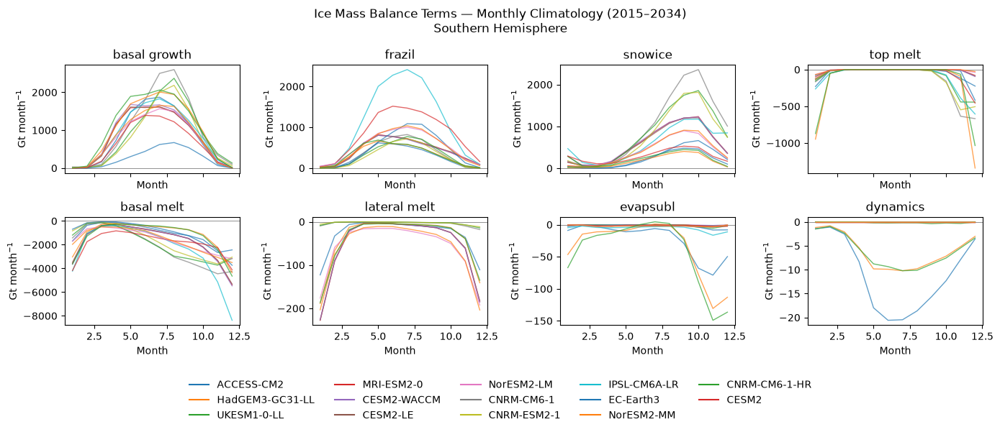

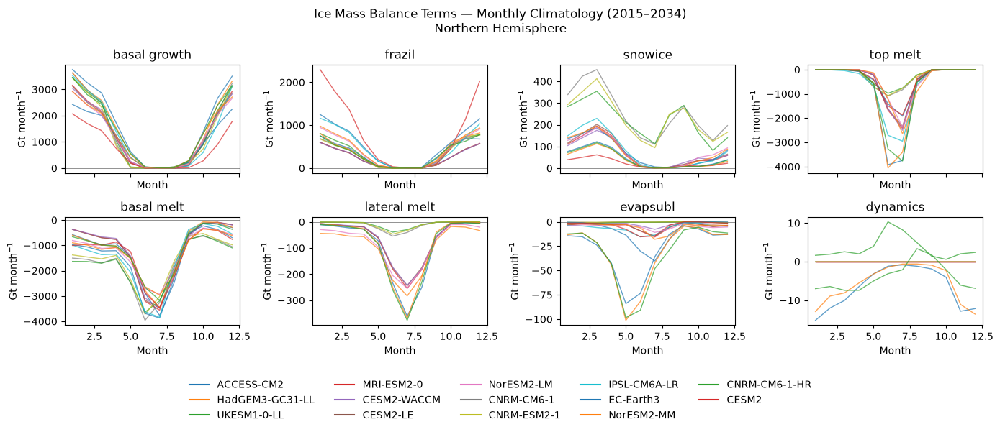

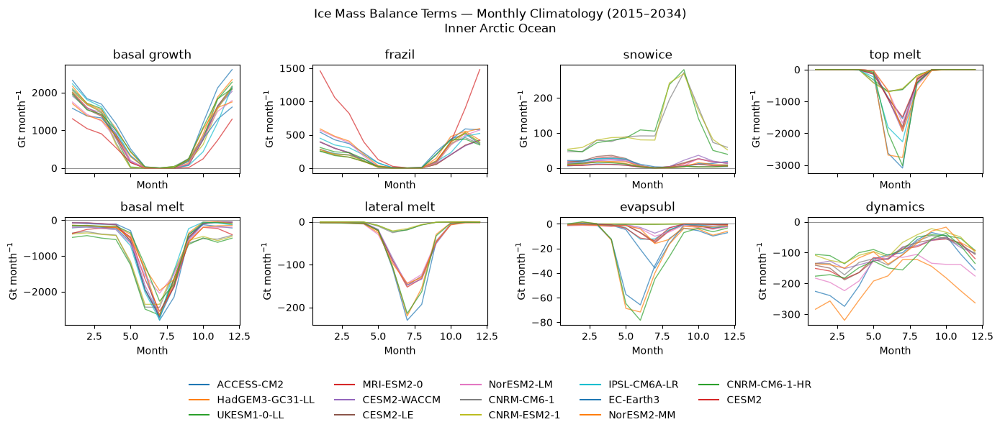

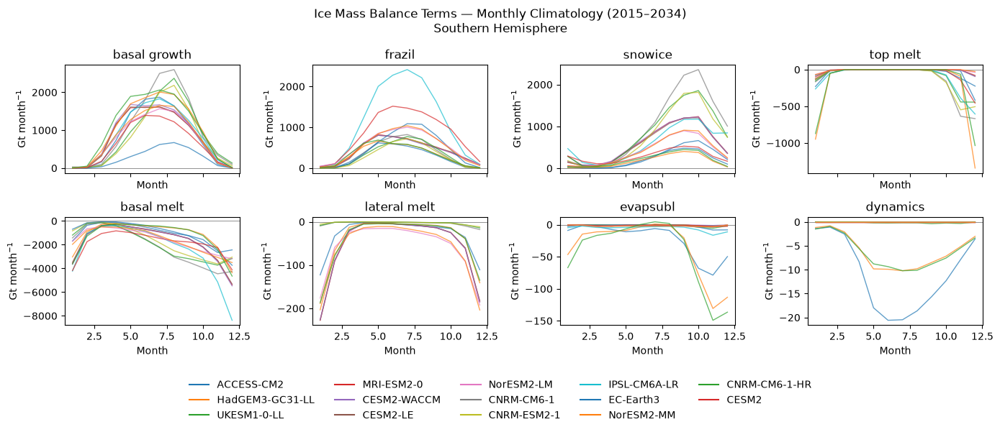

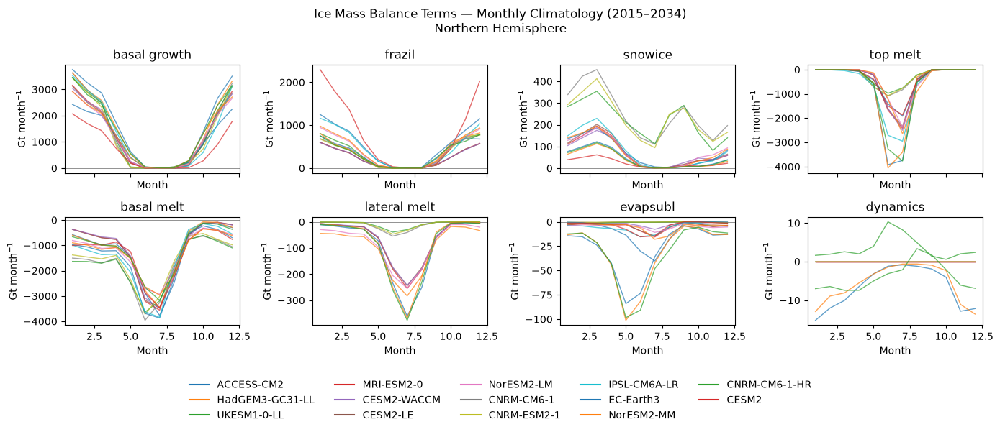

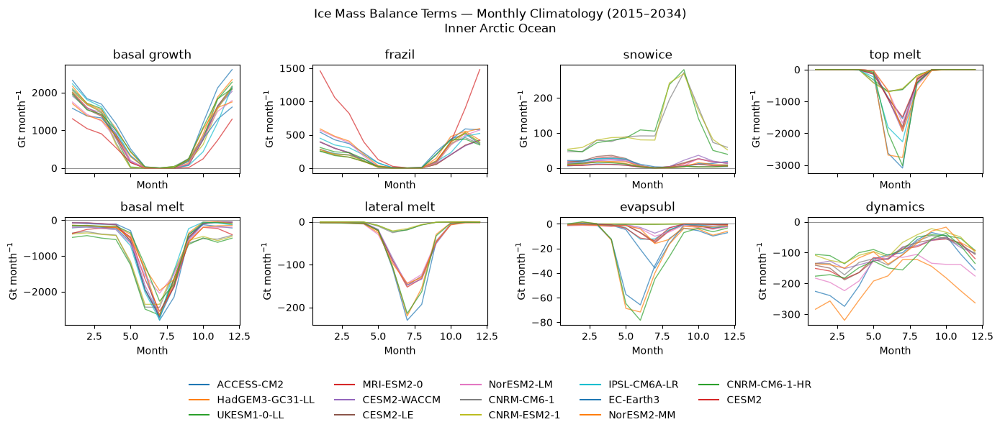

In [24]:
# ── Multipanel: ice mass balance terms, monthly climatology ──────────────────

def plot_ice_terms_climatology(budget, region_label, ncols=4):
    """One panel per ice budget term, one line per model's monthly climatology."""
    terms = list(budget.keys())
    clims = {term: ensemble_mean(budget[term]).groupby('time.month').mean() * 1e3 for term in terms}

    present_models = sorted(
        set().union(*(set(c.member_id.values) for c in clims.values())),
        key=lambda m: SANKEY_MODELS.index(m) if m in SANKEY_MODELS else len(SANKEY_MODELS),
    )
    model_colors = {m: plt.get_cmap('tab10')(i % 10) for i, m in enumerate(present_models)}

    nrows = int(np.ceil(len(terms) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.5 * ncols, 3 * nrows), sharex=True)
    axes = np.atleast_1d(axes).flatten()

    for ax, term in zip(axes, terms):
        clim = clims[term]
        for m in clim.member_id.values:
            clim.sel(member_id=m).plot(ax=ax, color=model_colors[m], lw=1, alpha=0.7)
        ax.axhline(0, color='0.5', lw=0.6, zorder=0)
        ax.set_title(term)
        ax.set_xlabel('Month')
        ax.set_ylabel('Gt month$^{-1}$')

    for ax in axes[len(terms):]:
        ax.set_visible(False)

    handles = [Line2D([0], [0], color=model_colors[m], lw=1.5, label=m) for m in present_models]
    ncol_legend = min(len(handles), 5)
    legend_rows = int(np.ceil(len(handles) / ncol_legend))
    bottom_margin = 0.04 + 0.035 * legend_rows

    fig.suptitle(f'Ice Mass Balance Terms — Monthly Climatology (2015–2034)\n{region_label}')
    fig.tight_layout(rect=[0, bottom_margin, 1, 1])
    fig.legend(handles=handles, loc='lower center', ncol=ncol_legend,
               bbox_to_anchor=(0.5, 0), frameon=False)
    return fig


for _budget, _region, _tag in [
    (ice_budget_SH, 'Southern Hemisphere', 'SO'),
    (ice_budget_NH, 'Northern Hemisphere', 'AO'),
    (ice_budget_IA, 'Inner Arctic Ocean', 'IA'),
]:
    _fig = plot_ice_terms_climatology(_budget, _region)
    _fig.savefig(f"figures/ice_terms_climatology_{_tag}_2015-2034.png", dpi=200, bbox_inches='tight')
    _fig.savefig(f"figures/ice_terms_climatology_{_tag}_2015-2034.pdf", bbox_inches='tight')
    plt.show()

### Snow Mass Budget

In [25]:
# ── Plotly Sankey: snow mass budget ───────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    #skip = ['ACCESS-CM2']
    skip = []
    if _model in skip:
        continue
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = SNOW_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('AO', _model) not in SCALE_BAR_SKIP) else None
    _snow_budget_filtered = {k: drop_sel(da, skip) for k, da in snow_budget_NH.items()}
    if SHOW_UNCERTAINTY:
        fig = make_snow_sankey_uncertainty_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            subtitle="Northern Hemisphere",
        )
    else:
        fig = make_snow_sankey_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            subtitle="Northern Hemisphere",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/snow_sankey_AO_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/snow_sankey_AO_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/snow_sankey_AO_{label}_2015-2034.svg")
    fig.show()


[normalization] Snow on Sea Ice Mass (ACCESS-CM2, Northern Hemisphere): reservoir=2,417.5 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.376, plot_area=154px


[normalization] Snow on Sea Ice Mass (HadGEM3-GC31-LL, Northern Hemisphere): reservoir=2,261.9 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.352, plot_area=148px


[normalization] Snow on Sea Ice Mass (UKESM1-0-LL, Northern Hemisphere): reservoir=2,414.8 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.376, plot_area=154px


[normalization] Snow on Sea Ice Mass (MRI-ESM2-0, Northern Hemisphere): reservoir=2,335.1 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.363, plot_area=151px


[normalization] Snow on Sea Ice Mass (CESM2-WACCM, Northern Hemisphere): reservoir=1,890.5 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.294, plot_area=113px


[normalization] Snow on Sea Ice Mass (CESM2-LE, Northern Hemisphere): reservoir=1,852.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.288, plot_area=133px


[normalization] Snow on Sea Ice Mass (NorESM2-LM, Northern Hemisphere): reservoir=2,105.3 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.328, plot_area=143px


[normalization] Snow on Sea Ice Mass (CNRM-CM6-1, Northern Hemisphere): reservoir=2,411.9 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.375, plot_area=176px


[normalization] Snow on Sea Ice Mass (CNRM-ESM2-1, Northern Hemisphere): reservoir=2,258.6 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.351, plot_area=148px


[normalization] Snow on Sea Ice Mass (IPSL-CM6A-LR, Northern Hemisphere): reservoir=2,118.5 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.330, plot_area=143px


[normalization] Snow on Sea Ice Mass (EC-Earth3, Northern Hemisphere): reservoir=1,922.3 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.299, plot_area=92px


[normalization] Snow on Sea Ice Mass (Multi-model mean, Northern Hemisphere): reservoir=2,195.8 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.342, plot_area=168px


In [26]:
# ── Plotly Sankey: snow mass budget ───────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    #skip = ['ACCESS-CM2']
    skip = []
    if _model in skip:
        continue
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = SNOW_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('IA', _model) not in SCALE_BAR_SKIP) else None
    _snow_budget_filtered = {k: drop_sel(da, skip) for k, da in snow_budget_IA.items()}
    if SHOW_UNCERTAINTY:
        fig = make_snow_sankey_uncertainty_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            subtitle="Inner Arctic Ocean",
        )
    else:
        fig = make_snow_sankey_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            subtitle="Inner Arctic Ocean",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/snow_sankey_IA_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/snow_sankey_IA_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/snow_sankey_IA_{label}_2015-2034.svg")
    fig.show()


[normalization] Snow on Sea Ice Mass (ACCESS-CM2, Inner Arctic Ocean): reservoir=1,334.9 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.208, plot_area=115px


[normalization] Snow on Sea Ice Mass (HadGEM3-GC31-LL, Inner Arctic Ocean): reservoir=1,290.2 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.201, plot_area=113px


[normalization] Snow on Sea Ice Mass (UKESM1-0-LL, Inner Arctic Ocean): reservoir=1,364.1 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.212, plot_area=116px


[normalization] Snow on Sea Ice Mass (MRI-ESM2-0, Inner Arctic Ocean): reservoir=1,553.4 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.242, plot_area=123px


[normalization] Snow on Sea Ice Mass (CESM2-WACCM, Inner Arctic Ocean): reservoir=1,211.4 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.188, plot_area=88px


[normalization] Snow on Sea Ice Mass (CESM2-LE, Inner Arctic Ocean): reservoir=1,184.5 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.184, plot_area=109px


[normalization] Snow on Sea Ice Mass (NorESM2-LM, Inner Arctic Ocean): reservoir=1,239.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.193, plot_area=89px


[normalization] Snow on Sea Ice Mass (CNRM-CM6-1, Inner Arctic Ocean): reservoir=1,563.3 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.243, plot_area=145px


[normalization] Snow on Sea Ice Mass (CNRM-ESM2-1, Inner Arctic Ocean): reservoir=1,484.8 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.231, plot_area=142px


[normalization] Snow on Sea Ice Mass (IPSL-CM6A-LR, Inner Arctic Ocean): reservoir=1,119.6 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.174, plot_area=107px


[normalization] Snow on Sea Ice Mass (EC-Earth3, Inner Arctic Ocean): reservoir=1,182.8 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.184, plot_area=65px


[normalization] Snow on Sea Ice Mass (Multi-model mean, Inner Arctic Ocean): reservoir=1,310.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.204, plot_area=136px


In [27]:
# ── Plotly Sankey: snow mass budget ───────────────────────────────────────────
for _model in SANKEY_MODELS + [None]:
    #skip = ['ACCESS-CM2']
    skip = []
    if _model in skip:
        continue
    _show_vals = SHOW_VALUES_MME if _model is None else SHOW_VALUES_MODELS
    _show_pct = SHOW_PERCENT_MME if _model is None else SHOW_PERCENT_MODELS
    _scale_bar = SNOW_SCALE_BAR_GT if (SHOW_SCALE_BAR and ('SO', _model) not in SCALE_BAR_SKIP) else None
    _snow_budget_filtered = {k: drop_sel(da, skip) for k, da in snow_budget_SH.items()}
    if SHOW_UNCERTAINTY:
        fig = make_snow_sankey_uncertainty_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_residual=SHOW_RESIDUAL,
            subtitle="Southern Hemisphere",
        )
    else:
        fig = make_snow_sankey_plotly(
            _snow_budget_filtered, model=_model,
            res_label="Snow", scale_ref=SNOW_SANKEY_SCALE_REF, res_color="#FFF59D",
            scale_bar_Gt=_scale_bar,
            show_values=_show_vals, show_residual=SHOW_RESIDUAL, show_percent=_show_pct,
            hide_terminal_nodes=True,
            subtitle="Southern Hemisphere",
        )
    label = _model if _model is not None else "MME"
    fig.write_image(f"figures/snow_sankey_SO_{label}_2015-2034.png", scale=3.125)
    fig.write_image(f"figures/snow_sankey_SO_{label}_2015-2034.pdf")
    #fig.write_image(f"figures/snow_sankey_SO_{label}_2015-2034.svg")
    fig.show()


[normalization] Snow on Sea Ice Mass (ACCESS-CM2, Southern Hemisphere): reservoir=4,092.5 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.637, plot_area=215px


[normalization] Snow on Sea Ice Mass (HadGEM3-GC31-LL, Southern Hemisphere): reservoir=4,648.4 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.723, plot_area=235px


[normalization] Snow on Sea Ice Mass (UKESM1-0-LL, Southern Hemisphere): reservoir=5,576.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.868, plot_area=269px


[normalization] Snow on Sea Ice Mass (MRI-ESM2-0, Southern Hemisphere): reservoir=6,427.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=1.000, plot_area=300px


[normalization] Snow on Sea Ice Mass (CESM2-WACCM, Southern Hemisphere): reservoir=4,880.8 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.759, plot_area=222px


[normalization] Snow on Sea Ice Mass (CESM2-LE, Southern Hemisphere): reservoir=4,712.2 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.733, plot_area=238px


[normalization] Snow on Sea Ice Mass (NorESM2-LM, Southern Hemisphere): reservoir=3,595.4 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.559, plot_area=197px


[normalization] Snow on Sea Ice Mass (CNRM-CM6-1, Southern Hemisphere): reservoir=4,411.0 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.686, plot_area=249px


[normalization] Snow on Sea Ice Mass (CNRM-ESM2-1, Southern Hemisphere): reservoir=3,384.7 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.527, plot_area=211px


[normalization] Snow on Sea Ice Mass (IPSL-CM6A-LR, Southern Hemisphere): reservoir=5,314.2 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.827, plot_area=259px


[normalization] Snow on Sea Ice Mass (EC-Earth3, Southern Hemisphere): reservoir=2,033.4 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.316, plot_area=96px


[normalization] Snow on Sea Ice Mass (Multi-model mean, Southern Hemisphere): reservoir=4,820.1 Gt yr⁻¹ / scale_ref=6,427.0 Gt yr⁻¹ -> scale factor=0.750, plot_area=263px


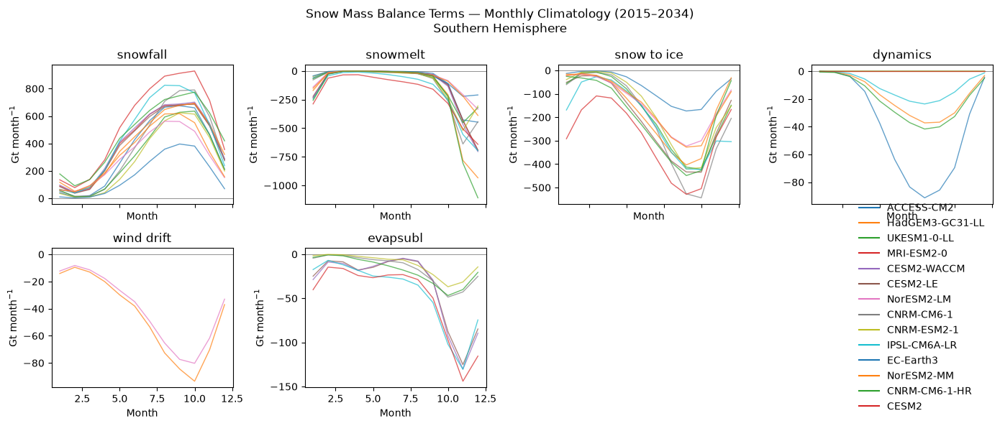

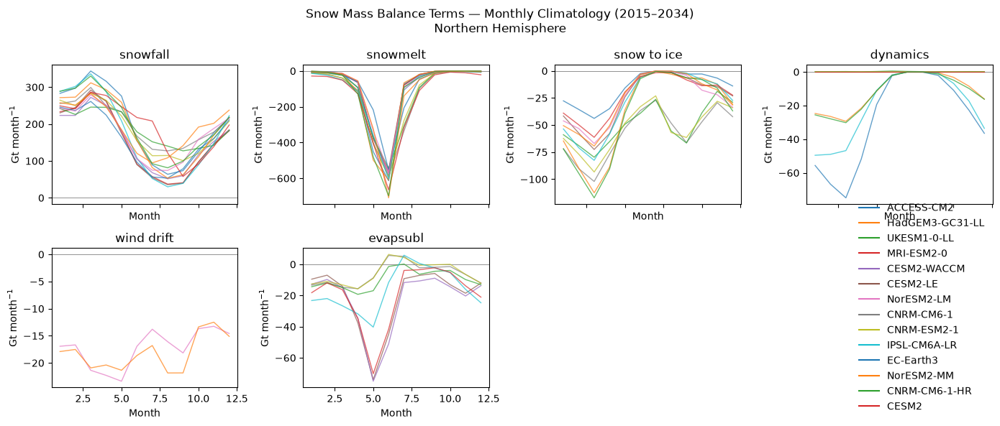

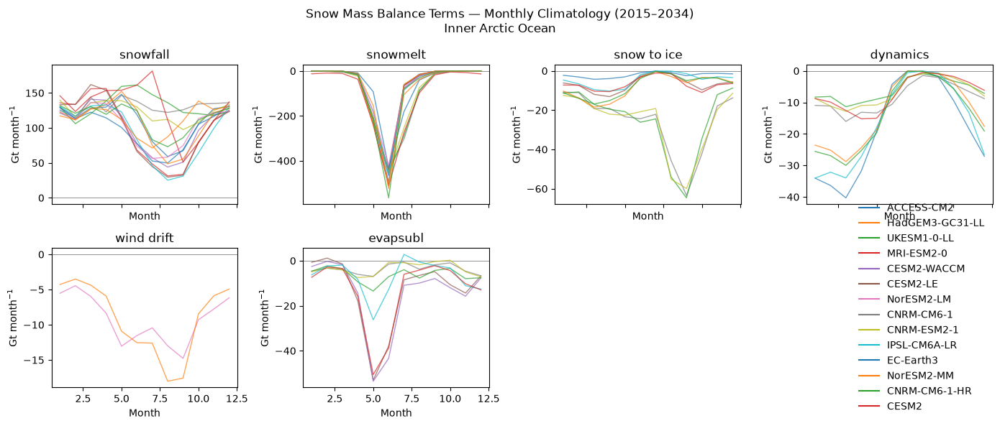

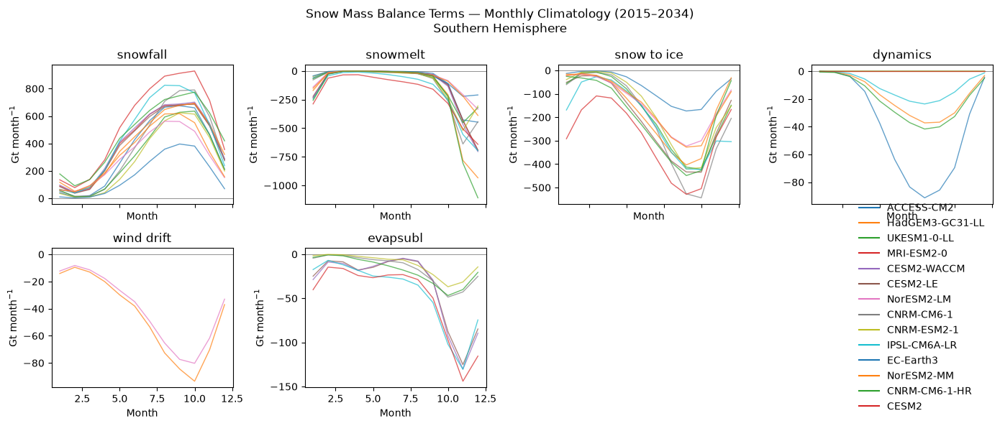

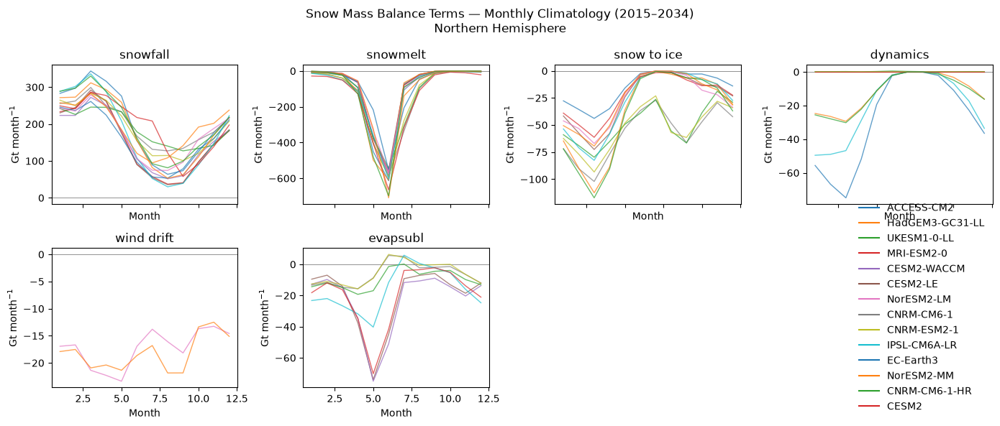

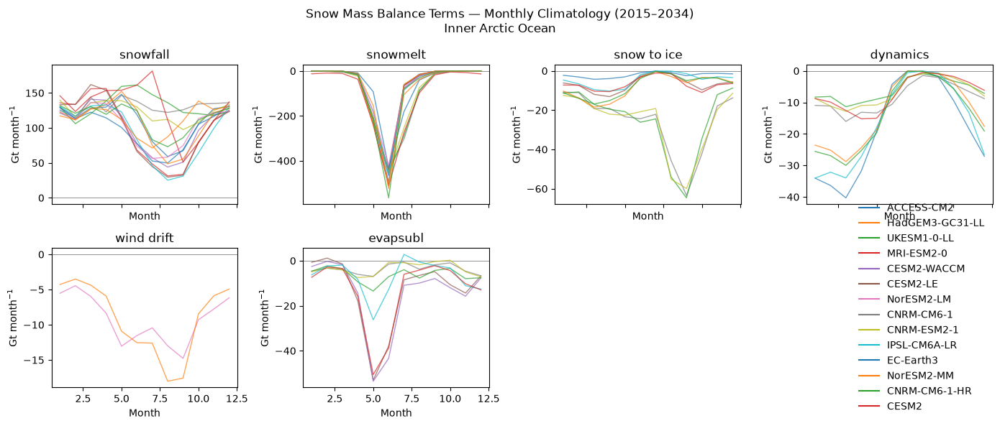

In [28]:
# ── Multipanel: snow mass balance terms, monthly climatology ──────────────────

def plot_ice_terms_climatology(budget, region_label, ncols=4):
    """One panel per ice budget term, one line per model's monthly climatology."""
    terms = list(budget.keys())
    clims = {term: ensemble_mean(budget[term]).groupby('time.month').mean() * 1e3 for term in terms}

    present_models = sorted(
        set().union(*(set(c.member_id.values) for c in clims.values())),
        key=lambda m: SANKEY_MODELS.index(m) if m in SANKEY_MODELS else len(SANKEY_MODELS),
    )
    model_colors = {m: plt.get_cmap('tab10')(i % 10) for i, m in enumerate(present_models)}

    nrows = int(np.ceil(len(terms) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.5 * ncols, 3 * nrows), sharex=True)
    axes = np.atleast_1d(axes).flatten()

    for ax, term in zip(axes, terms):
        clim = clims[term]
        for m in clim.member_id.values:
            clim.sel(member_id=m).plot(ax=ax, color=model_colors[m], lw=1, alpha=0.7)
        ax.axhline(0, color='0.5', lw=0.6, zorder=0)
        ax.set_title(term)
        ax.set_xlabel('Month')
        ax.set_ylabel('Gt month$^{-1}$')

    for ax in axes[len(terms):]:
        ax.set_visible(False)

    handles = [Line2D([0], [0], color=model_colors[m], lw=1.5, label=m) for m in present_models]
    fig.legend(handles=handles, loc='lower right', ncol=1,
               bbox_to_anchor=(0.99, 0.02), frameon=False)
    fig.suptitle(f'Snow Mass Balance Terms — Monthly Climatology (2015–2034)\n{region_label}')
    fig.tight_layout()
    return fig


for _budget, _region, _tag in [
    (snow_budget_SH, 'Southern Hemisphere', 'SO'),
    (snow_budget_NH, 'Northern Hemisphere', 'AO'),
    (snow_budget_IA, 'Inner Arctic Ocean', 'IA'),
]:
    _fig = plot_ice_terms_climatology(_budget, _region)
    _fig.savefig(f"figures/snow_terms_climatology_{_tag}_2015-2034.png", dpi=200, bbox_inches='tight')
    _fig.savefig(f"figures/snow_terms_climatology_{_tag}_2015-2034.pdf", bbox_inches='tight')
    plt.show()